In [24]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [25]:
import robust_uncertainty
import numpy as np

In [26]:
mu_d = 13.0
gan = 13.0
beta= 0.85
sig = -1e-2

rho = 0.5
c_d = 1.0

In [27]:
from PIL import Image
import os
import re

seed = 5


def gif_diff_gamma(sig):
    for ganmma in np.arange(9, 18, 1.0):
        mit_lq = robust_uncertainty.mis(rho, mu_d, ganmma, c_d, sig, beta)
        mit_lq.combine_plots()


def create_gif_from_directory(base_dir, gif_name="combined_animation.gif", frame_duration=300):
    """
    指定されたディレクトリからGIFを作成する。

    :param base_dir: 画像が含まれている基本ディレクトリのパス。
    :param gif_name: 作成されるGIFファイルの名前。
    :param frame_duration: 各フレームの表示時間（ミリ秒）。
    """
    images = []

    # 基本ディレクトリ内のすべてのサブディレクトリを取得
    subdirectories = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

    # 浮動小数点数であるサブディレクトリ名のみを選択
    float_subdirs = [d for d in subdirectories if re.match(r'^-?\d+\.\d+$', d)]

    # 浮動小数点数の順序に従ってソート
    float_subdirs.sort(key=float)

    # 各サブディレクトリから画像を読み込む
    for subdir in float_subdirs:
        image_path = os.path.join(base_dir, subdir, "combined_image.png")
        if os.path.exists(image_path):
            images.append(Image.open(image_path))

    # 画像が見つかった場合、GIFを作成
    if images:
        gif_path = os.path.join(base_dir, gif_name)
        images[0].save(gif_path, save_all=True, append_images=images[1:], loop=0, duration=frame_duration)
        print(f"GIFが保存されました: {gif_path}")
    else:
        print("指定されたパスに画像が見つかりませんでした。")

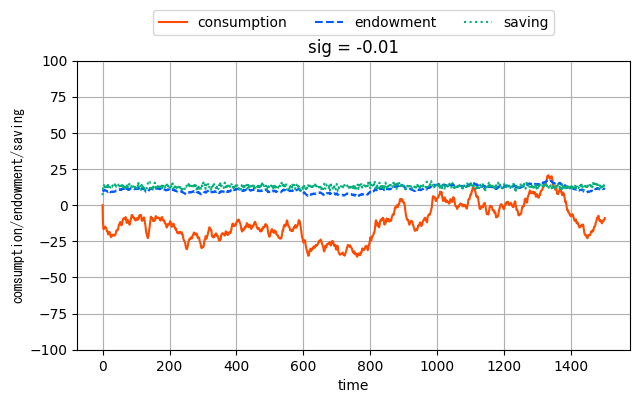

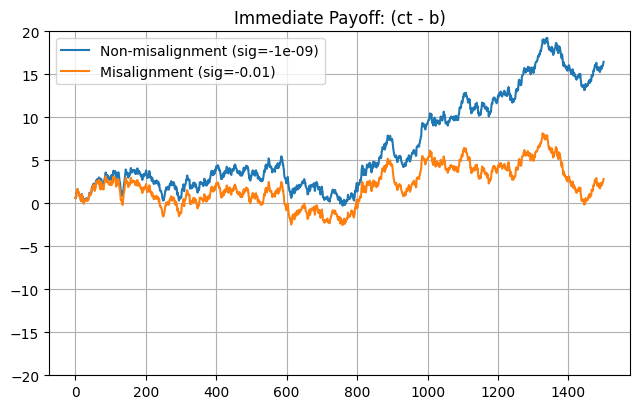

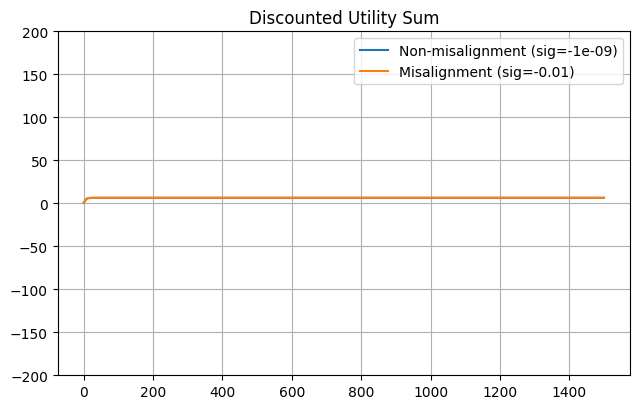

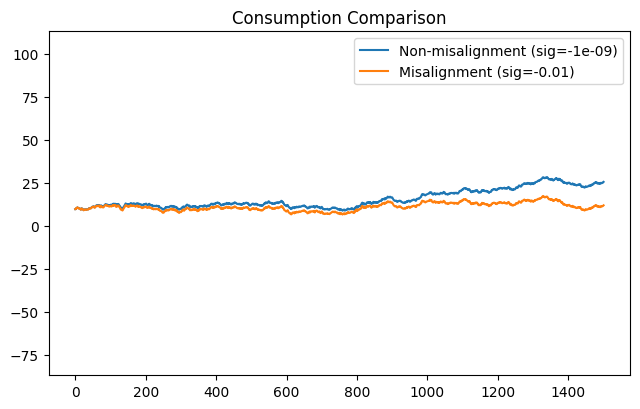

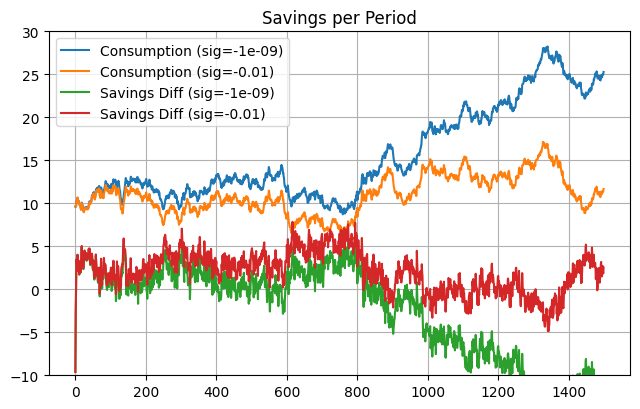

...

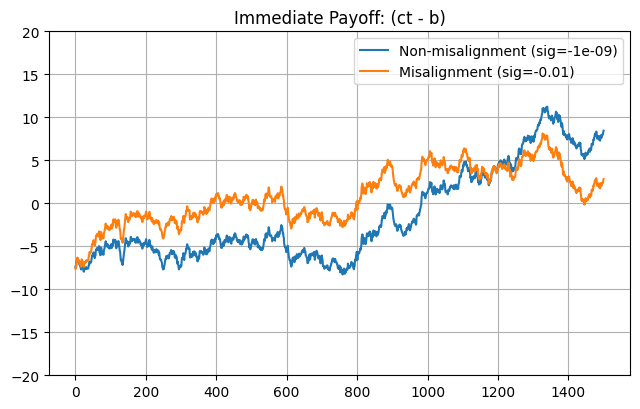

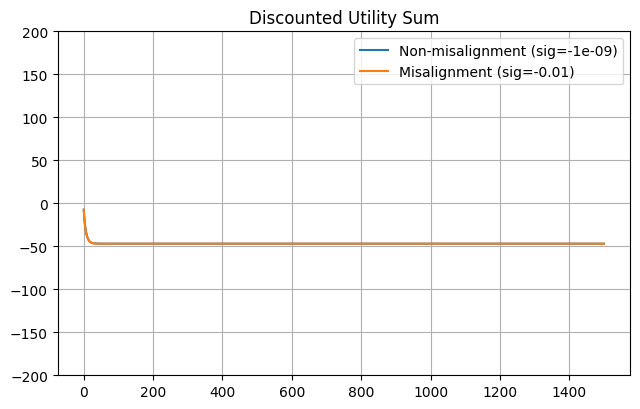

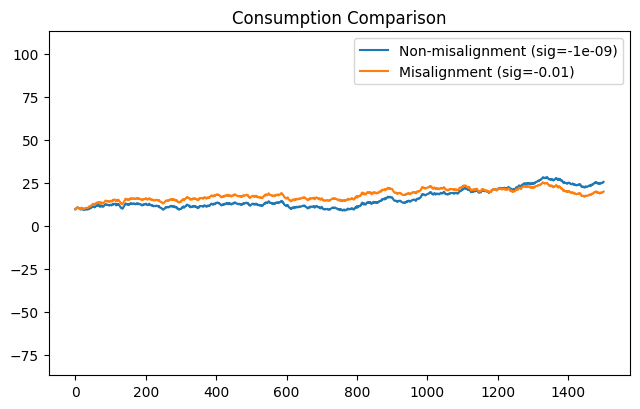

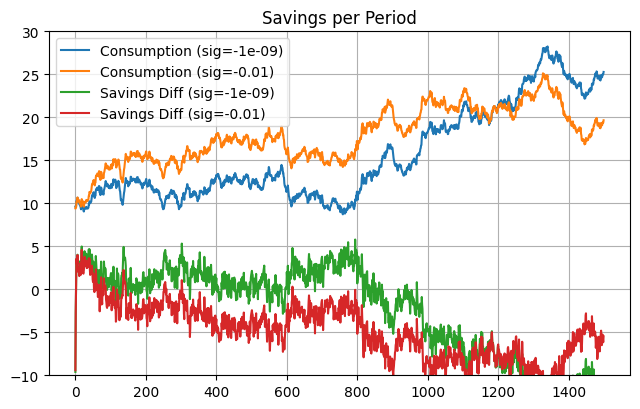

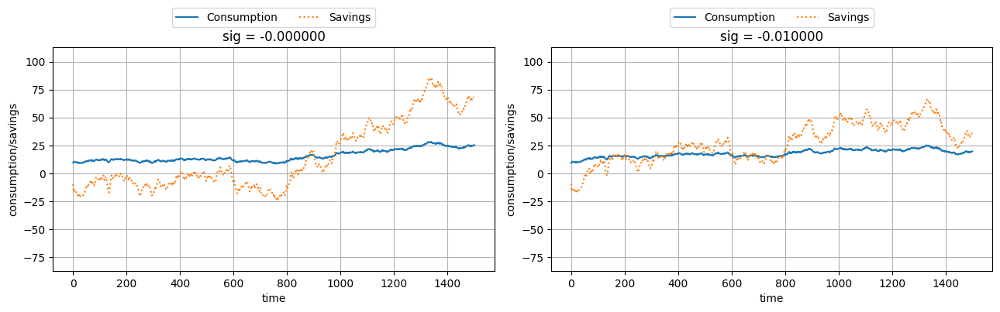

In [28]:
gif_diff_gamma(-0.01)


c:\Users\theko\Desktop\UEC\岩崎研\ミニプロジェクト_20230417\lqcontrol\robust_uncertainty.py:197: RuntimeWarning: overflow encountered in matmul
  y[i, :] = ABF @ y[i - 1, :].T + self.C.T * self.eps[i - 1]
c:\Users\theko\Desktop\UEC\岩崎研\ミニプロジェクト_20230417\lqcontrol\robust_uncertainty.py:197: RuntimeWarning: invalid value encountered in matmul
  y[i, :] = ABF @ y[i - 1, :].T + self.C.T * self.eps[i - 1]
c:\Users\theko\Desktop\UEC\岩崎研\ミニプロジェクト_20230417\lqcontrol\robust_uncertainty.py:405: RuntimeWarning: overflow encountered in multiply
  k_mis_diff = k_mis[1:] - R_kinri * k_mis[:-1]
c:\Users\theko\Desktop\UEC\岩崎研\ミニプロジェクト_20230417\lqcontrol\robust_uncertainty.py:405: RuntimeWarning: invalid value encountered in subtract
  k_mis_diff = k_mis[1:] - R_kinri * k_mis[:-1]


GIFが保存されました: ./plt_robust_uncertainty/5/0.85_-0.5\combined_animation.gif
GIFが保存されました: ./plt_robust_uncertainty/5/0.85_-0.1\combined_animation.gif
GIFが保存されました: ./plt_robust_uncertainty/5/0.85_-0.01\combined_animation.gif
GIFが保存されました: ./plt_robust_uncertainty/5/0.85_-0.001\combined_animation.gif


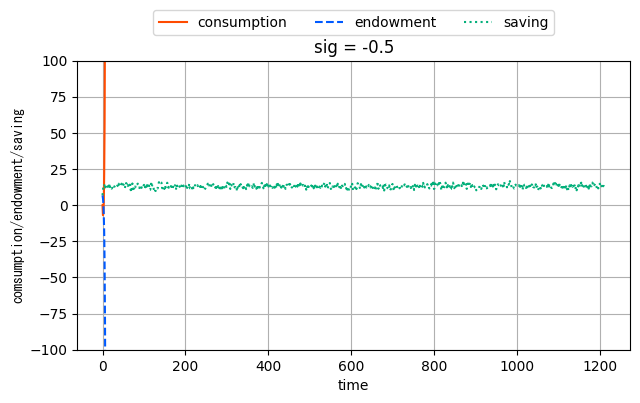

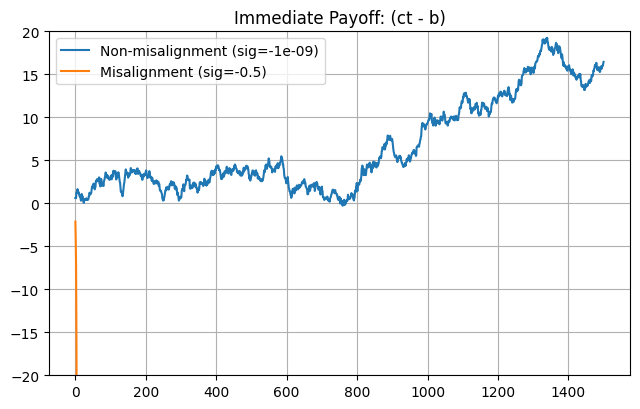

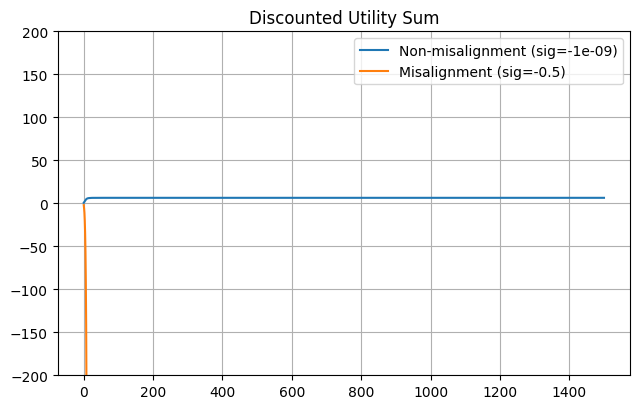

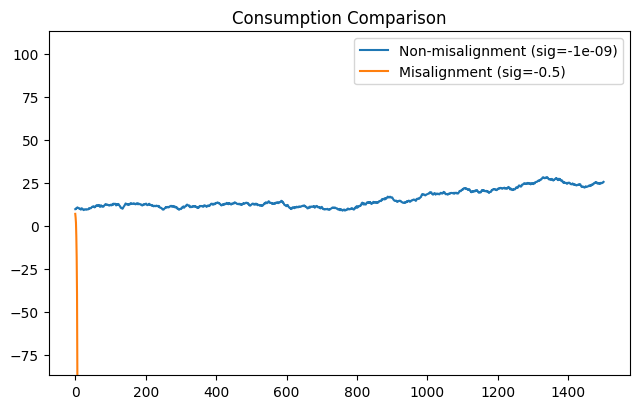

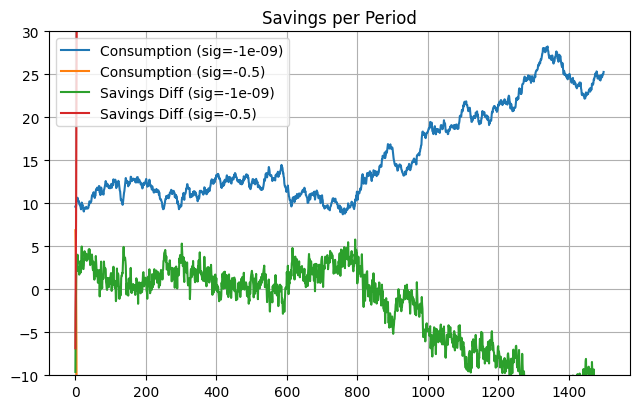

...

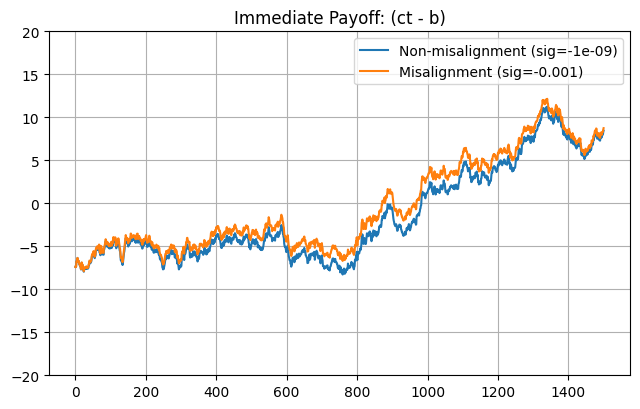

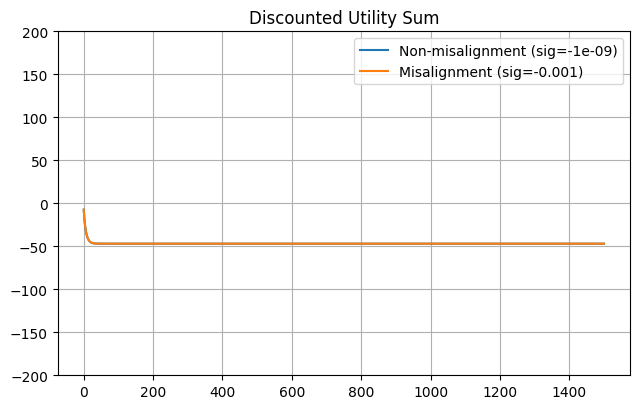

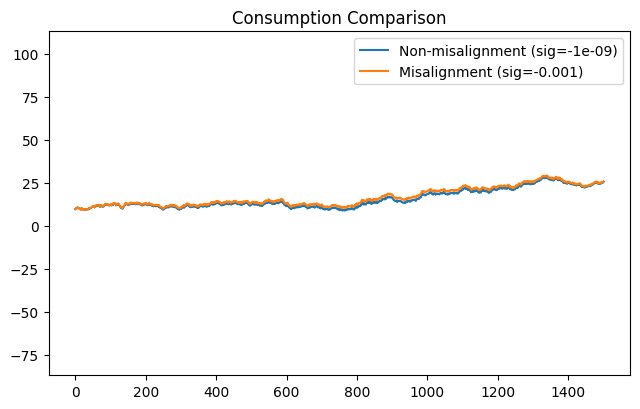

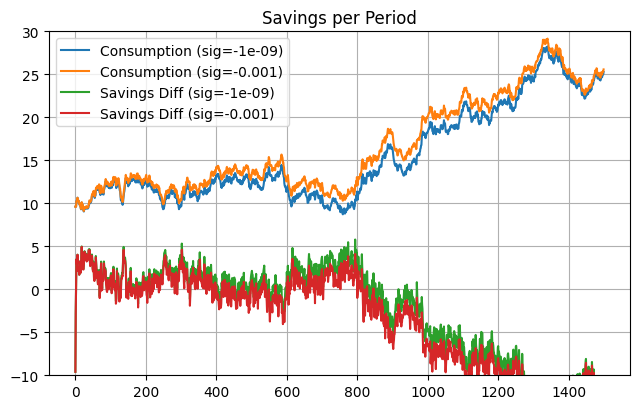

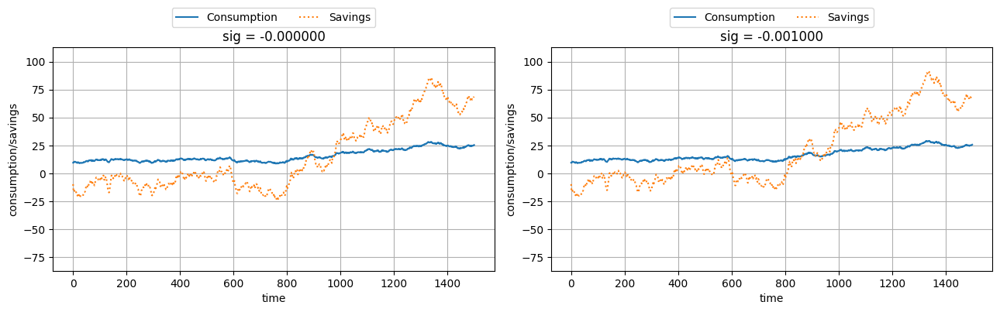

In [29]:
for sig in [-0.5,-1e-1,-1e-2,-1e-3]:
    gif_diff_gamma(sig)
    create_gif_from_directory(f"./plt_robust_uncertainty/{seed}/{beta}_{sig}")